# Exploratory Data Analysis (EDA)

Our EDA will focus on analysing the categorical and numerical columns provided in the dataset. We aimed to obtain some understanding on the data distribution, the interaction between variables and how these combination of variables relate to the target: Machine Failure. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import levene

## Data Cleaning

The data loaded here is a set of synthetic dataset modeled after an existing milling machine. Cited here is the original source of dataset:
- S. Matzka, "Explainable Artificial Intelligence for Predictive Maintenance Applications," 2020 Third International Conference on Artificial Intelligence for Industries (AI4I), 2020, pp. 69-74, doi: 10.1109/AI4I49448.2020.00023.

In [2]:
df = pd.read_csv("../dataset/ai4i2020.csv")

In [3]:
# Display dataset info
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Machine failure          10000 non-null  int64  
 9   TWF                      10000 non-null  int64  
 10  HDF                      10000 non-null  int64  
 11  PWF                      10000 non-null  int64  
 12  OSF                      10000 non-null  int64  
 13  RNF                      10000 non-null  int64  
dtypes: float64(3), int64(9)

In [4]:
df.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [5]:
df.columns

Index(['UDI', 'Product ID', 'Type', 'Air temperature [K]',
       'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]',
       'Tool wear [min]', 'Machine failure', 'TWF', 'HDF', 'PWF', 'OSF',
       'RNF'],
      dtype='object')

It is observed that the raw dataset contains 5 numerical features.

In [6]:
numerical_cols = ['Air temperature [K]', 
                  'Process temperature [K]', 
                  'Rotational speed [rpm]', 
                  'Torque [Nm]', 
                  'Tool wear [min]']

There are machines that may contain more than one failure mode.

In [7]:
set(list(zip(df['Machine failure'], df['TWF'], df['HDF'], df['OSF'], df['RNF'])))

{(0, 0, 0, 0, 0),
 (0, 0, 0, 0, 1),
 (1, 0, 0, 0, 0),
 (1, 0, 0, 1, 0),
 (1, 0, 1, 0, 0),
 (1, 0, 1, 1, 0),
 (1, 1, 0, 0, 0),
 (1, 1, 0, 0, 1),
 (1, 1, 0, 1, 0)}

Found out that 'RNF' (Random Failure) is not recorded as machine failure.

In [8]:
df[df['RNF']==1]['Machine failure'].value_counts()

0    18
1     1
Name: Machine failure, dtype: int64

In [9]:
df[df['RNF']==1]

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
1221,1222,M16081,M,297.0,308.3,1399,46.4,132,0,0,0,0,0,1
1302,1303,L48482,L,298.6,309.8,1505,45.7,144,0,0,0,0,0,1
1748,1749,H31162,H,298.4,307.7,1626,31.1,166,0,0,0,0,0,1
2072,2073,L49252,L,299.6,309.5,1570,35.5,189,0,0,0,0,0,1
2559,2560,L49739,L,299.3,309.0,1447,50.4,140,0,0,0,0,0,1
3065,3066,M17925,M,300.1,309.2,1687,27.7,95,0,0,0,0,0,1
3452,3453,H32866,H,301.6,310.5,1602,32.3,2,0,0,0,0,0,1
3611,3612,L50791,L,301.7,310.9,1405,46.4,207,1,1,0,0,0,1
5471,5472,L52651,L,302.7,312.3,1346,61.2,170,0,0,0,0,0,1
5489,5490,L52669,L,302.6,312.1,1499,35.0,215,0,0,0,0,0,1


No null value for each columns

In [10]:
df.isnull().sum()

UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Machine failure            0
TWF                        0
HDF                        0
PWF                        0
OSF                        0
RNF                        0
dtype: int64

No duplicates found

In [11]:
df.duplicated().sum()

0

### Dataset quality
No data cleaning is needed as the dataset is complete with no missing value and duplicated row. The columns are easily understood according to the column names and brief description given by the author. Each columns provided seems helpful for the analysis in the next step as all are related to the measurements during machine operations. 

### Dataset size
The dataset size of 10,000 is not too heavy for further processing so there is no any batching or extraction of dataset required. We will move on to the analysis part to learn more about the underlying information carried by the dataset.

## Analyse interactions between features

- 'Air temperature' and 'Process temperature' are positively correlated
- 'Rotational speed' and 'Torque' are negatively correlated

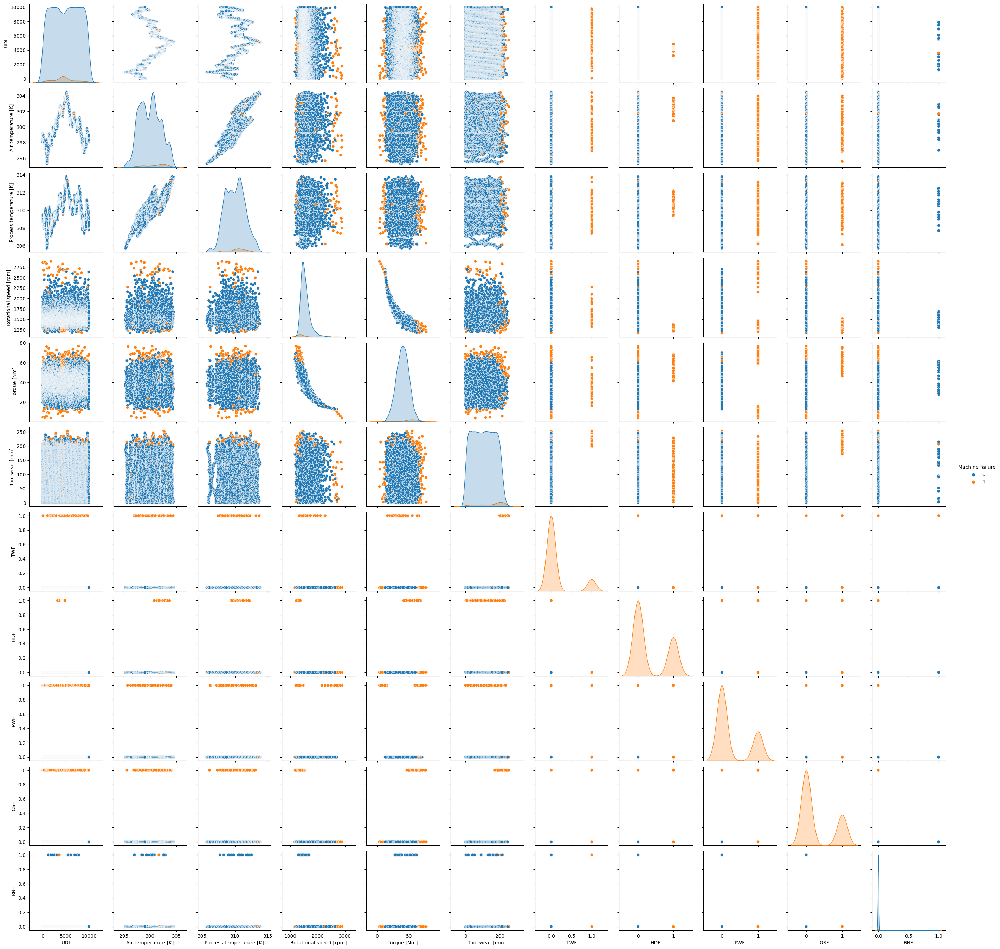

In [12]:
# pairplot
sns.pairplot(df, hue='Machine failure')
plt.show()

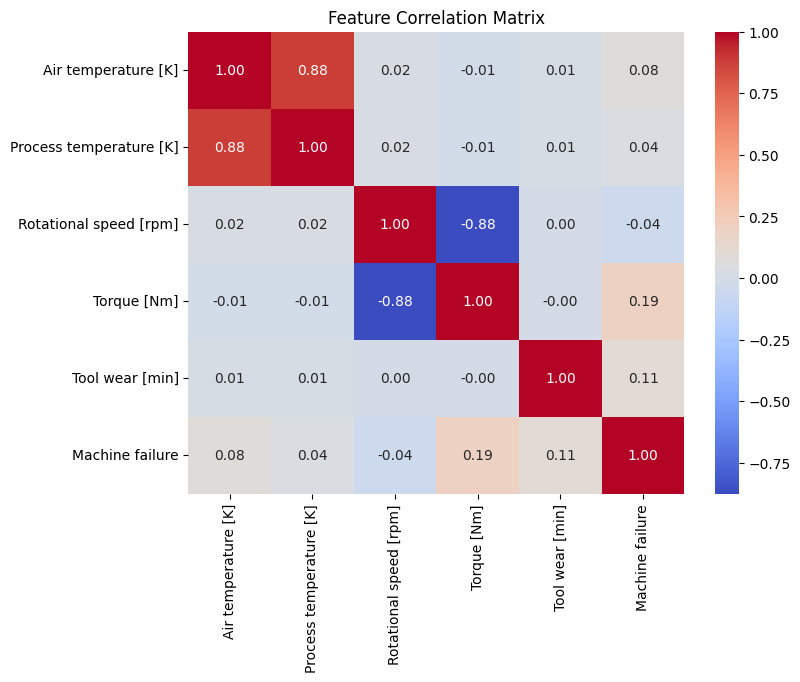

In [13]:
# correlation matrix
variables = numerical_cols + ['Machine failure']
corr_matrix = df[[col for col in variables]].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Matrix")
plt.show()

### Process temperature [K] & Air temperature [K]
- Both variables has the same unit and proportional to each other
- Machine failure is scattered on the joint distribution of both variables -> only weakly correlated to the target machine failure, or the variables have non-linear relationship
- Process temperature is always higher than air temperature for each rows
- Temperature difference [K] = Process temperature [K] - Air temperature [K]

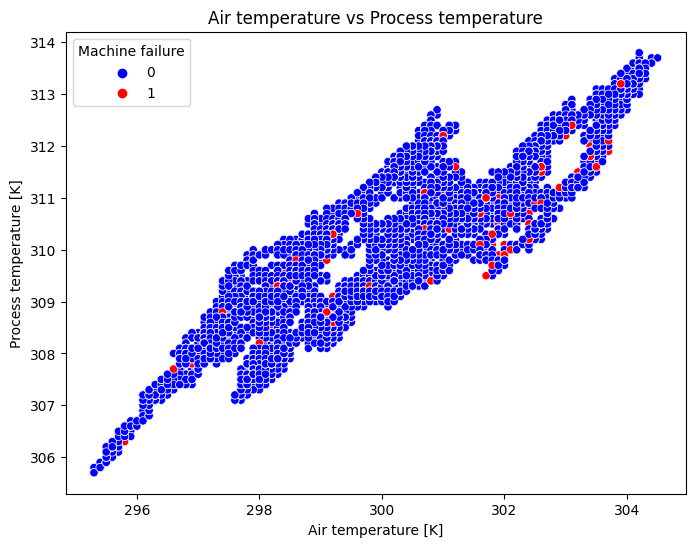

In [14]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=df['Air temperature [K]'], y=df['Process temperature [K]'], hue=df['Machine failure'], 
                palette={0: 'blue', 1: 'red'})
plt.title("Air temperature vs Process temperature")
plt.xlabel("Air temperature [K]")
plt.ylabel("Process temperature [K]")
plt.show()

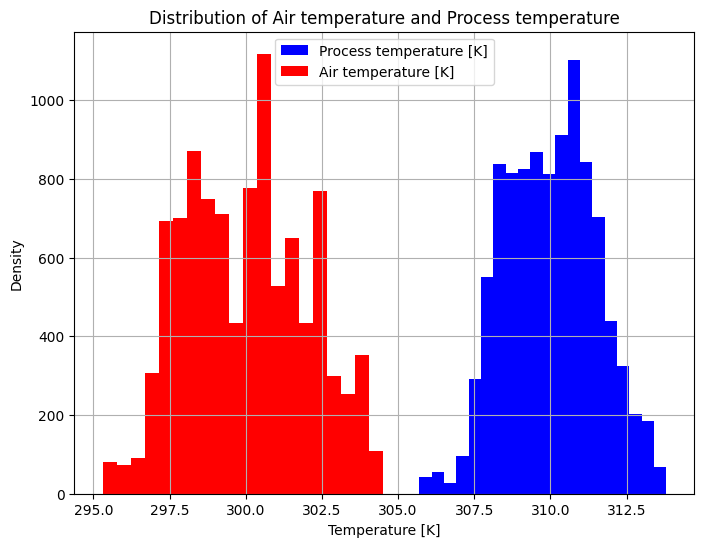

In [15]:
# Histogram
plt.figure(figsize=(8, 6))
plt.hist(df['Process temperature [K]'], bins=20, color='blue', label='Process temperature [K]')
plt.hist(df['Air temperature [K]'], bins=20, color='red', label='Air temperature [K]')

plt.xlabel('Temperature [K]')
plt.ylabel('Density')
plt.title('Distribution of Air temperature and Process temperature')
plt.legend()
plt.grid(True)
plt.show()

In [16]:
# Let's also study this created feature in EDA
df['Temp diff'] = df['Process temperature [K]'] - df['Air temperature [K]'] 

In [17]:
numerical_cols.append('Temp diff')

### Rotational speed [rpm] & Torque [Nm]
- The two features have strong negative correlation
- Not only correlation with one another, their joint distribution has more obvious correlation with machine failure than the temperature features
- Machine failure may occured at the extreme left and right of the joint distribution
- rpm_torque = Rotational speed [rpm] * Torque [Nm]

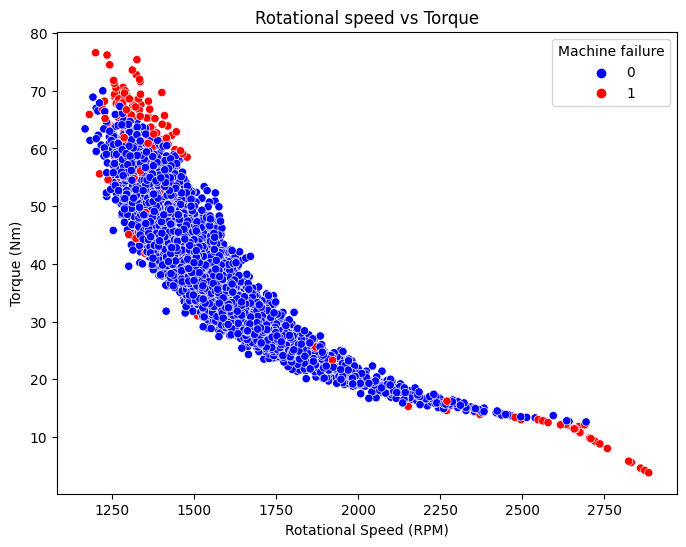

In [18]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=df['Rotational speed [rpm]'], y=df['Torque [Nm]'], hue=df['Machine failure'], 
                palette={0: 'blue', 1: 'red'})
plt.title("Rotational speed vs Torque")
plt.xlabel("Rotational Speed (RPM)")
plt.ylabel("Torque (Nm)")
plt.show()

# let's have a big picture on relationship between rpm-torque

In [19]:
df['rpm_torque'] = df['Rotational speed [rpm]'] * df['Torque [Nm]']

In [20]:
numerical_cols.append('rpm_torque')

## Analysis based on 'Type'

- product type L (low quality) has the greatest portion, whereas H (high quality) has the lowest.
- type L is incorporated with slightly more machine failure (There is possibility that product quality is affected by machine functionality/failure).
- the dataset is highly **imbalance** that machine failure target occupies only a very small portion.

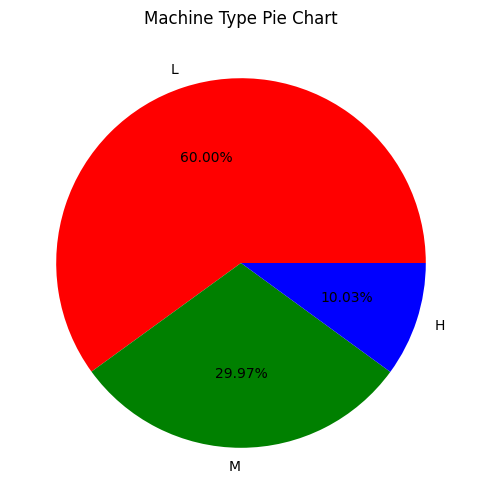

In [21]:
type_portion = df['Type'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(type_portion, labels=type_portion.index, autopct='%1.2f%%', colors=['red', 'green', 'blue'])
plt.title('Machine Type Pie Chart')
plt.show()

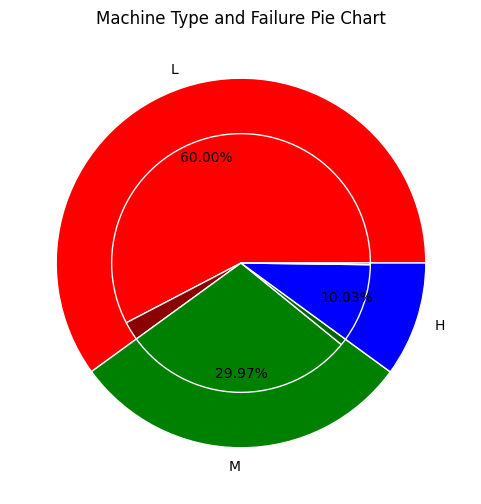

In [22]:
# Failure in each type
type_portion = df['Type'].value_counts()
failure_portion = df[df['Machine failure'] == 1]['Type'].value_counts()
non_failure_portion = type_portion - failure_portion

# Prepare the inner circle portions
inner_sizes = []
inner_labels = []
inner_colors = []
base_colors = ['red', 'green', 'blue']

for i, type in enumerate(type_portion.index):
    inner_sizes.extend([non_failure_portion[type], failure_portion[type]])
    inner_labels.extend(["", ""])
    inner_colors.extend([base_colors[i], f'dark{base_colors[i]}'])  # Light for normal, dark for failure

# Pie chart
fig, ax = plt.subplots(figsize=(6, 6))

# Outer pie
ax.pie(
    type_portion, labels=type_portion.index, autopct='%1.2f%%', 
    colors=base_colors, radius=1.0, wedgeprops={'edgecolor': 'white'}
)

# Inner pie
ax.pie(
    inner_sizes, labels=inner_labels, colors=inner_colors, 
    radius=0.7, wedgeprops={'edgecolor': 'white'}
)

plt.title('Machine Type and Failure Pie Chart')
plt.show()


In [23]:
df.groupby('Type')['Type'].value_counts()
df.groupby('Type')['Machine failure'].value_counts(normalize=True)

Type  Machine failure
H     0                  0.979063
      1                  0.020937
L     0                  0.960833
      1                  0.039167
M     0                  0.972306
      1                  0.027694
Name: Machine failure, dtype: float64

### Analyse relationship between 'Type' with other variables

Distribution plot
- Not much disparate between 'Type' on the shape of distribution of different variables.
- 'Rotational speed' is rightly skewed -> consider transform the feature with log for futher investigation
- 'Temp diff' shows binomial curve, but the bimodal cannot be distinguished using 'Type'

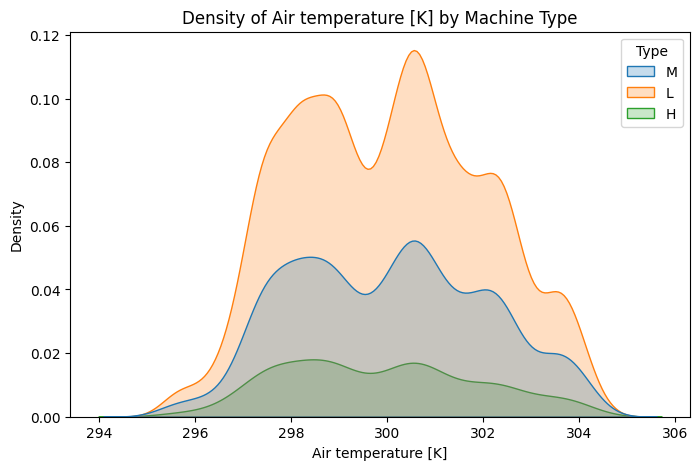

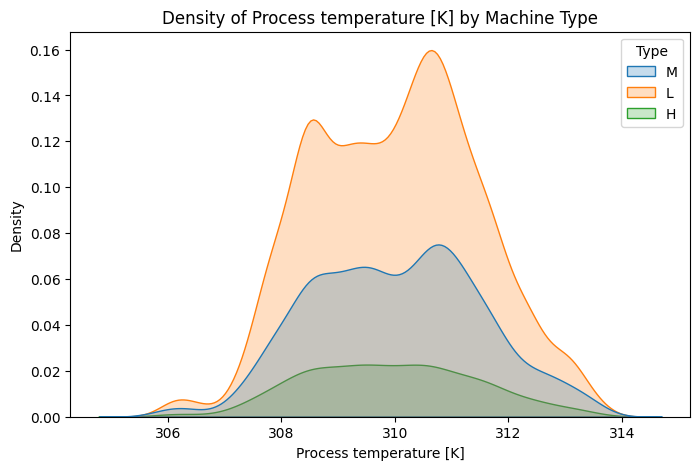

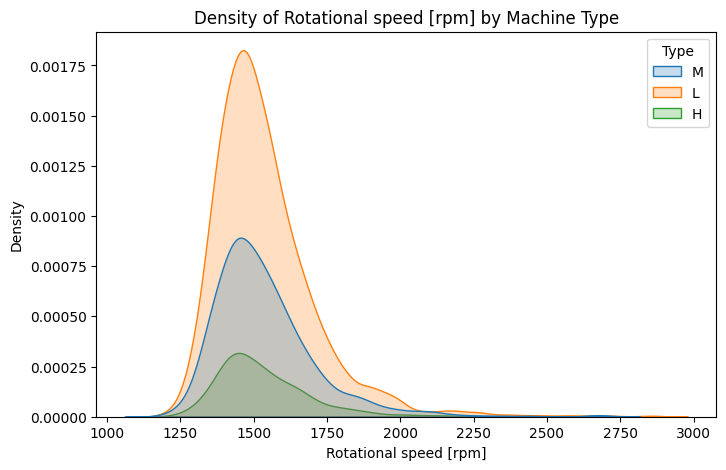

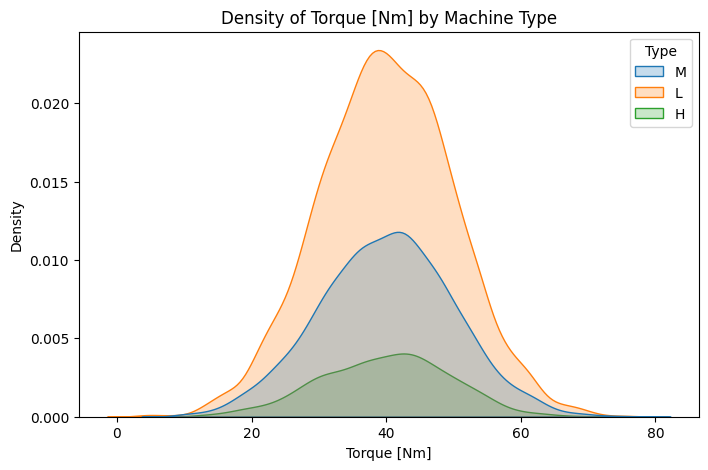

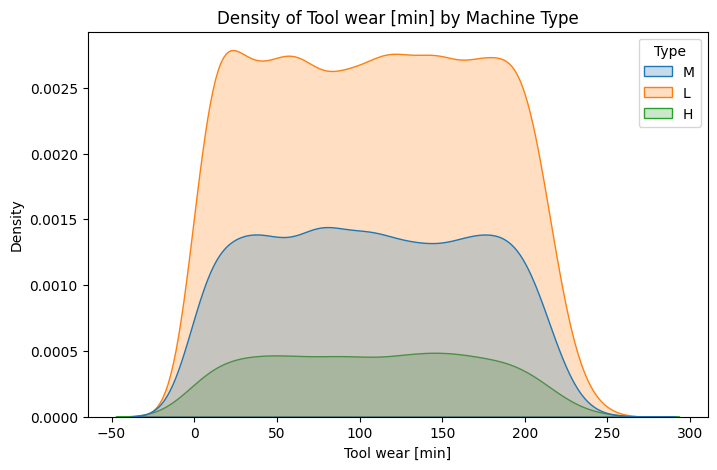

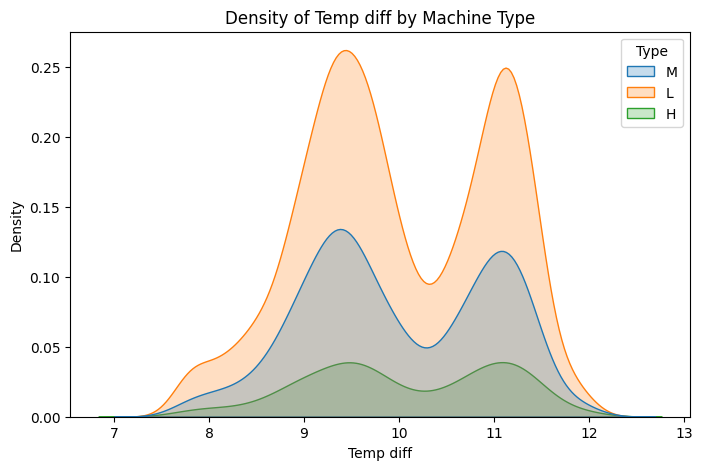

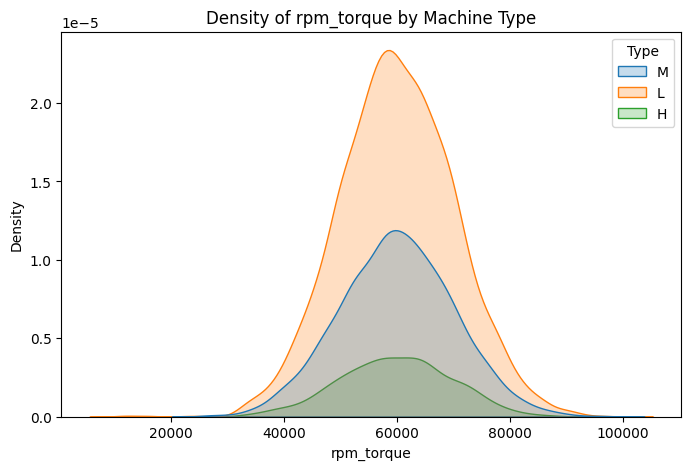

In [24]:
for col in numerical_cols:
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=df, x=col, hue='Type', fill=True)
    plt.title(f'Density of {col} by Machine Type')
    plt.show()


Box plot
- Type H has a very slightly lower average air and process temperature than the other two types
- Type H has less outlier on rotational speed and torque than the other two types
- Not much difference between different 'Type' on the average and distribution of each variables
- Most of the distributions are not skewed except that 'Rotational speed' has outliers on its right, causing it slightly skewed to the right.

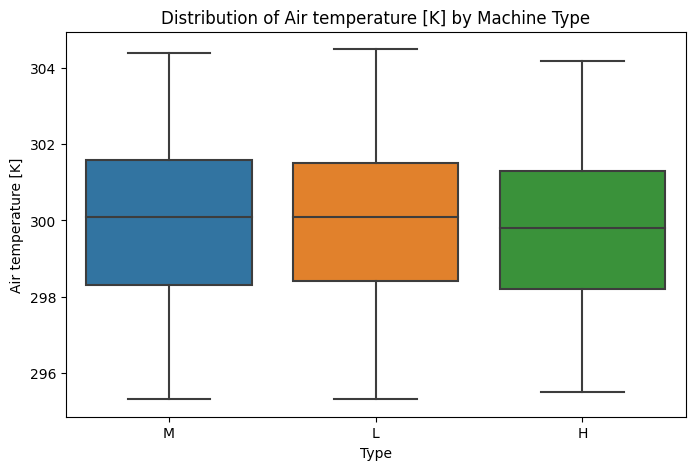

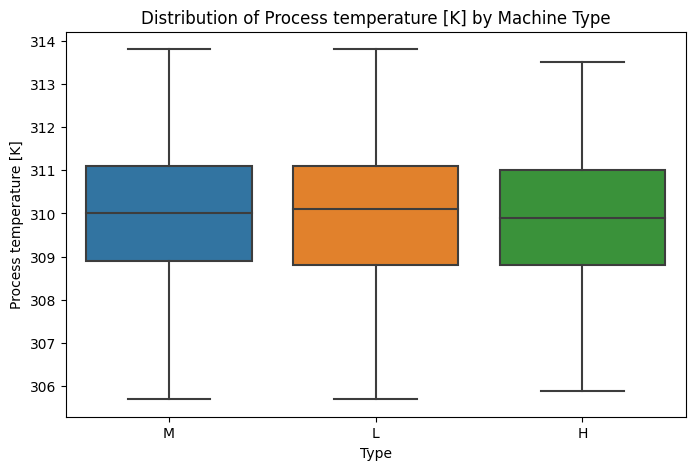

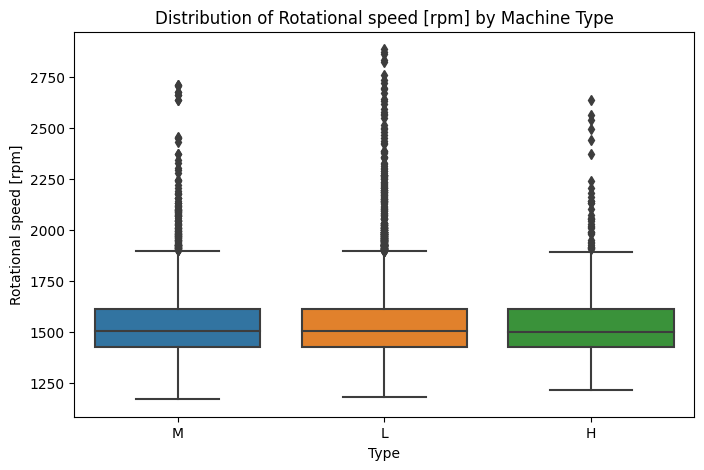

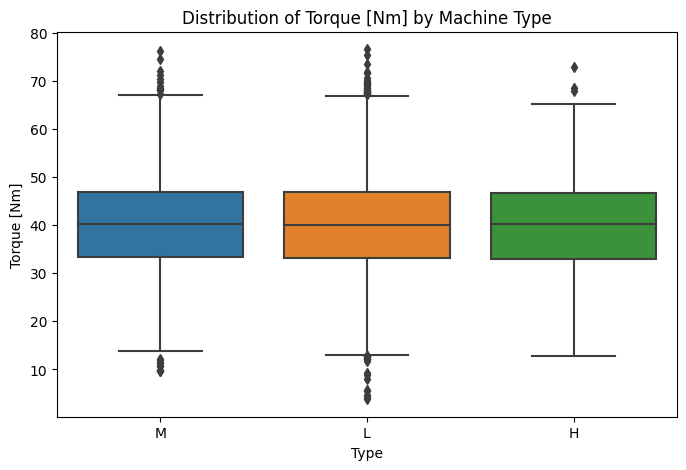

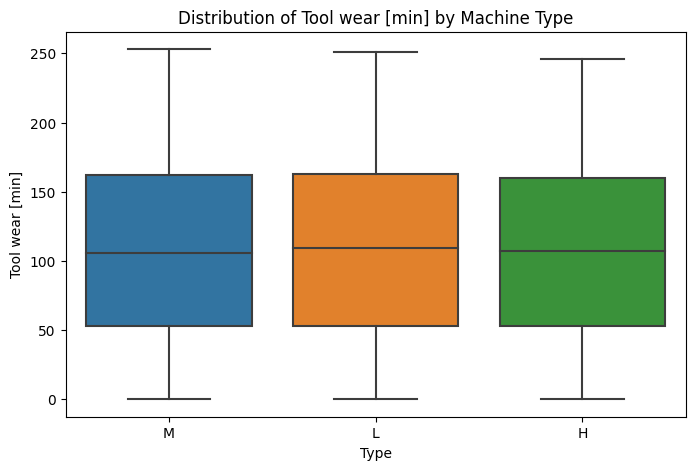

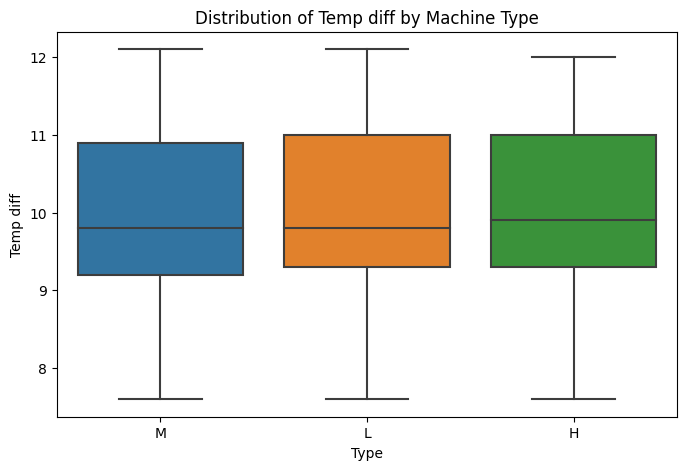

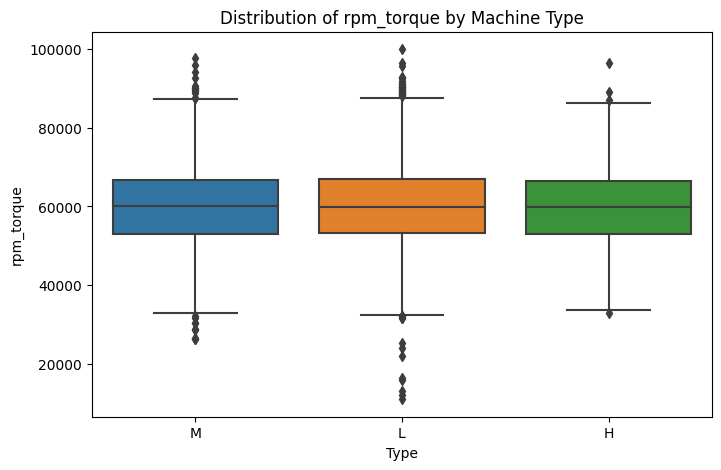

In [25]:
df['Type'] = df['Type'].astype(str)

for col in numerical_cols:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x='Type', y=col, data=df)
    plt.title(f'Distribution of {col} by Machine Type')
    plt.show()


Findings 'Type' does not have significant effect on the distribution of the features -> consider not involving 'Type' in model building
- ANOVA F-test: No significant difference between the means of the three product type. (p-value for 'Air temperature' is the closest to the alpha value, if this variable is included as the model feature, consider involving 'Type' as well)
- Levene test: No significant difference between the variances of the three product type.

In [26]:
# ANOVA F-test to check mean differences between 'Type' group
# H_0: There is significant difference between the means contributed by distribution of different categories.
# H_1: There is no significant difference between the means contributed by distribution of different categories.

def anova_f_test(column, group, dataset):
    categories = dataset[group].unique()
    groups = [dataset[dataset[group] == category][column] for category in categories]
    f_stat, p_value = stats.f_oneway(*groups)
    print(f'{column} \n ANOVA F-statistic: {f_stat:.4f}, p-value: {p_value:.4f}\n')

for col in numerical_cols:
    anova_f_test(col, 'Type', df)

# Since the p-values are greater than 0.05, we have sufficient evidence to reject the null hypothesis.

Air temperature [K] 
 ANOVA F-statistic: 2.6964, p-value: 0.0675

Process temperature [K] 
 ANOVA F-statistic: 1.6332, p-value: 0.1954

Rotational speed [rpm] 
 ANOVA F-statistic: 0.1156, p-value: 0.8909

Torque [Nm] 
 ANOVA F-statistic: 0.1282, p-value: 0.8797

Tool wear [min] 
 ANOVA F-statistic: 0.3408, p-value: 0.7112

Temp diff 
 ANOVA F-statistic: 1.9255, p-value: 0.1459

rpm_torque 
 ANOVA F-statistic: 0.1395, p-value: 0.8698



In [27]:
# Levene test to check whether there is difference between variances of various 'Type' group
# H_0: There is significant difference between the variances of distribution of different categories.
# H_1: There is no significant difference between the variances of distribution of different of different categories.
def levene_test(column, group, dataset):
    categories = dataset[group].unique()
    groups = [dataset[dataset[group] == category][column] for category in categories]
    w_stat, p_value = levene(*groups)
    print(f'{column} \n W-statistic: {w_stat:.4f}, p-value: {p_value:.4f}\n')

for col in numerical_cols:
    levene_test(col, 'Type', df)
# Since the p-values are greater than 0.05, we have sufficient evidence to reject the null hypothesis.

Air temperature [K] 
 W-statistic: 0.9389, p-value: 0.3911

Process temperature [K] 
 W-statistic: 0.4356, p-value: 0.6469

Rotational speed [rpm] 
 W-statistic: 0.4007, p-value: 0.6699

Torque [Nm] 
 W-statistic: 0.7434, p-value: 0.4755

Tool wear [min] 
 W-statistic: 1.1824, p-value: 0.3066

Temp diff 
 W-statistic: 1.0900, p-value: 0.3363

rpm_torque 
 W-statistic: 0.4445, p-value: 0.6411



Transform 'Rotational speed' with log function
- Since this feature has its distribution slighly rightly-skewed
- The outcome is still with slightly right skewness; hence, decided to use the untransformed original 'Rotational speed'

In [28]:
df['log_rpm'] = np.log10(df['Rotational speed [rpm]'])

(array([  15.,   92.,  474., 1266., 1978., 1980., 1535., 1066.,  649.,
         354.,  224.,  153.,   68.,   50.,   33.,   17.,   15.,   11.,
          14.,    6.]),
 array([3.06744284, 3.08708552, 3.10672819, 3.12637087, 3.14601354,
        3.16565621, 3.18529889, 3.20494156, 3.22458424, 3.24422691,
        3.26386958, 3.28351226, 3.30315493, 3.32279761, 3.34244028,
        3.36208296, 3.38172563, 3.4013683 , 3.42101098, 3.44065365,
        3.46029633]),
 <BarContainer object of 20 artists>)

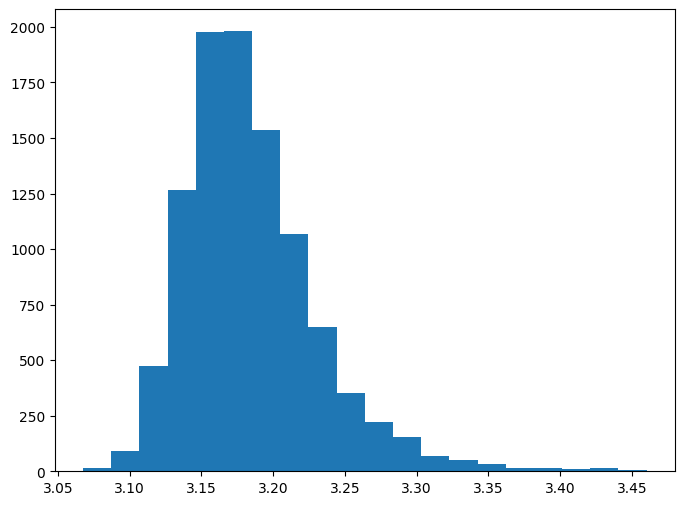

In [29]:
plt.figure(figsize=(8, 6))
plt.hist(df['log_rpm'], bins=20, label='log_rpm')

## Analysis based on 'Machine failure'

Distribution plot
- Overlapping of air and process temperature between failure and non-failure group -> the failure is clustered in between the distribution for non-failure
- 'Rotational speed' and 'Torque' tends to relate with machine failure when the data point is at the extreme left and right of the distribution

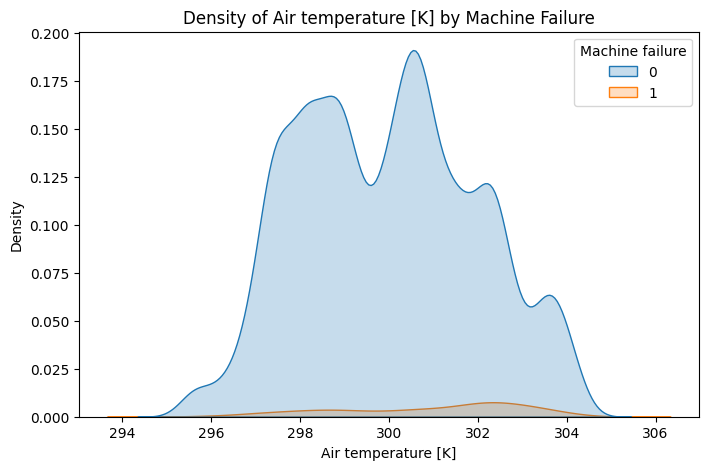

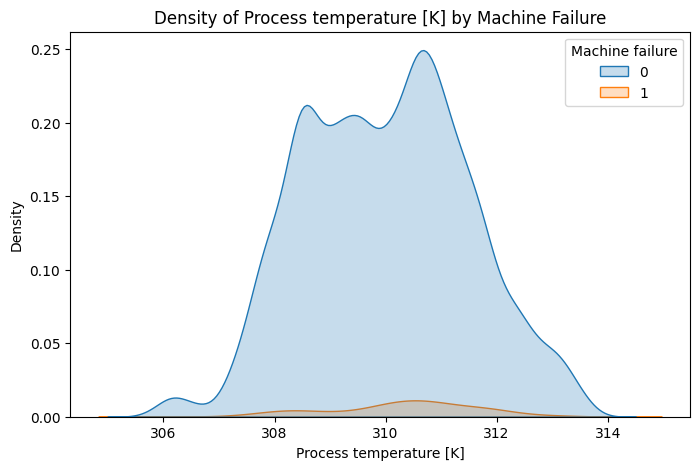

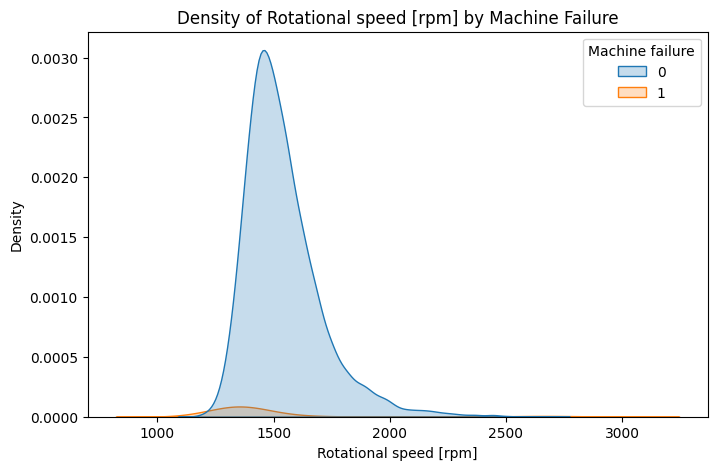

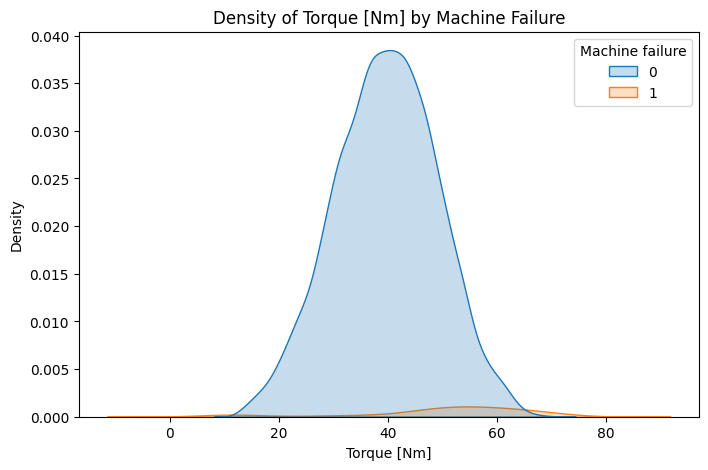

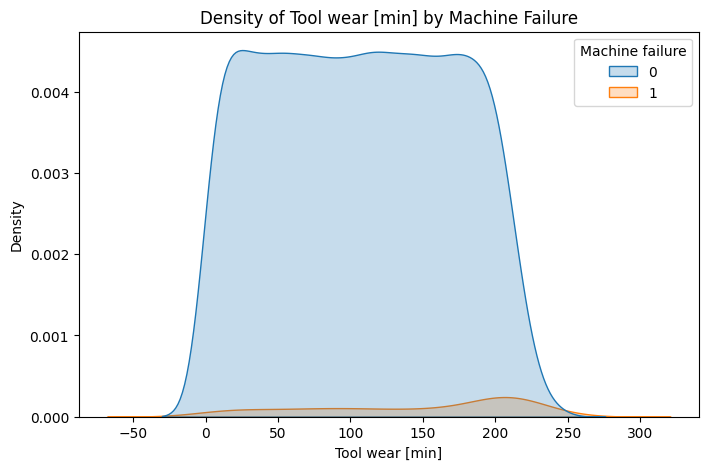

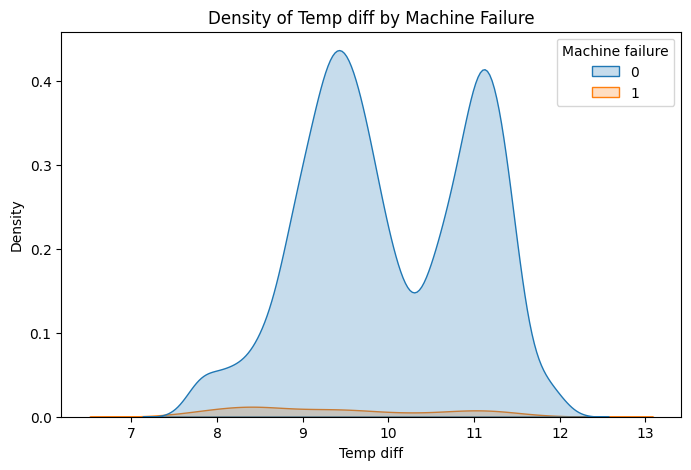

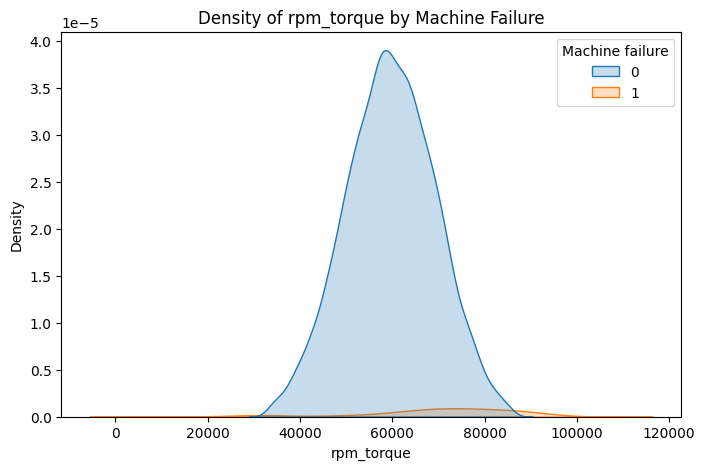

In [30]:
for col in numerical_cols:
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=df, x=col, hue='Machine failure', fill=True)
    plt.title(f'Density of {col} by Machine Failure')
    plt.show()

Violin Plot
- Same as previous analysis, for temperature-related features, the temperature for failure data points are not separated from the non-failure data distribution, similar situation also applies for 'Tool Wear'
- 'Rotational speed' and 'Torque' have more obvious segmentation between failure and non-failure data points at certain position

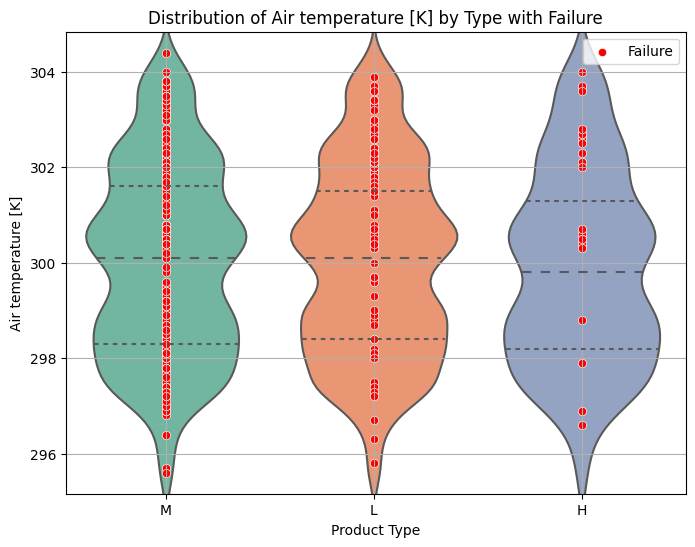

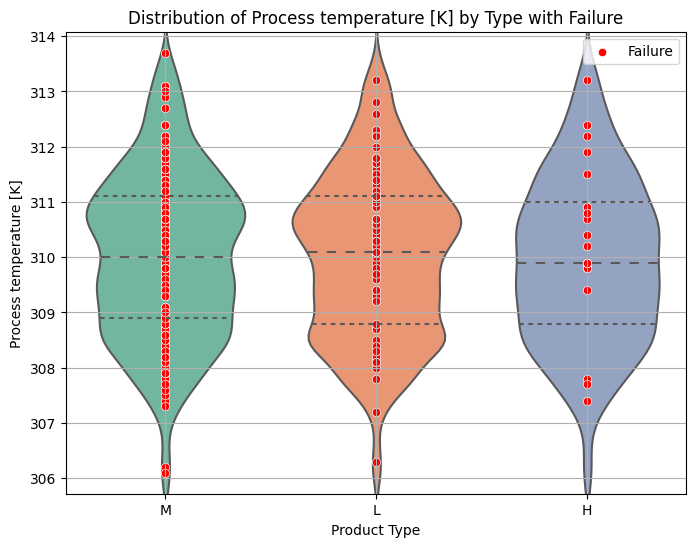

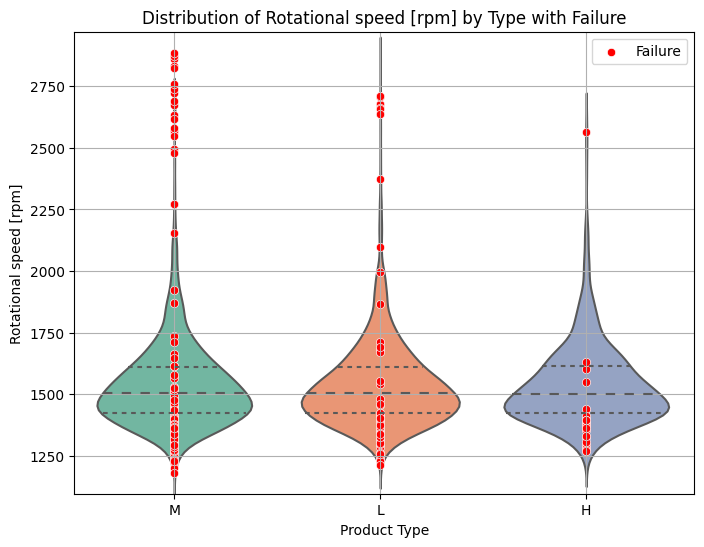

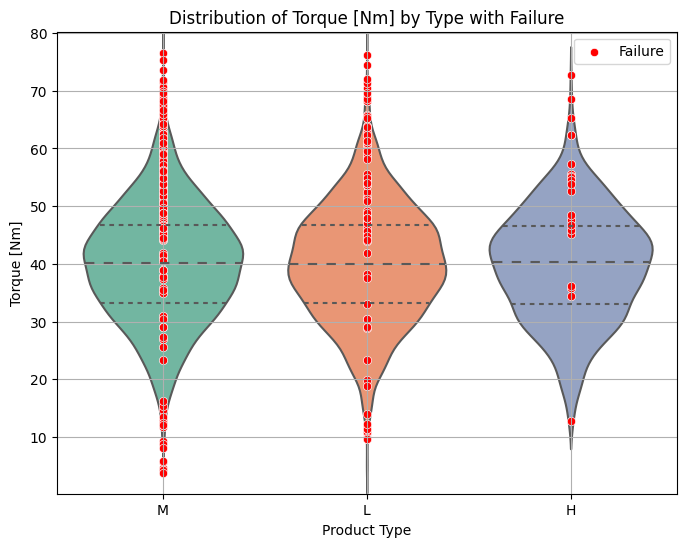

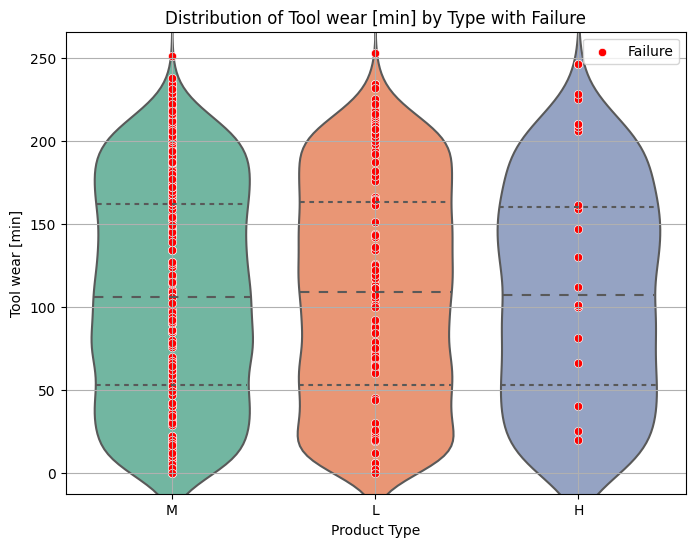

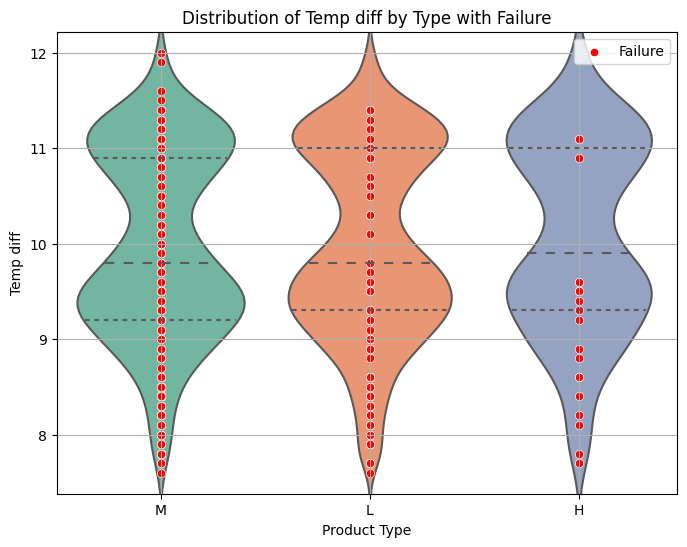

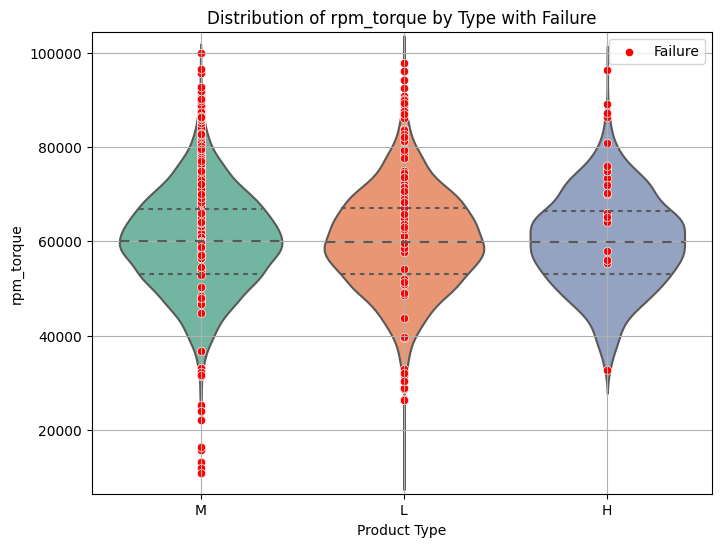

In [31]:
for col in numerical_cols:    
    plt.figure(figsize=(8, 6))

    # Boxplot or Violin Plot for Distribution
    sns.violinplot(x=df['Type'], y=df[col], inner="quartile", palette="Set2", alpha=0.7)

    # Overlay anomalies as red dots
    failure = df[df['Machine failure'] == 1]
    sns.scatterplot(x=failure['Type'], y=failure[col], color='red', marker='o', label='Failure')

    # Labels & Title
    plt.xlabel("Product Type")
    plt.ylabel(col)
    plt.title(f"Distribution of {col} by Type with Failure")
    plt.legend()
    plt.grid(True)
    plt.show()

In [32]:
df.columns

Index(['UDI', 'Product ID', 'Type', 'Air temperature [K]',
       'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]',
       'Tool wear [min]', 'Machine failure', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF',
       'Temp diff', 'rpm_torque', 'log_rpm'],
      dtype='object')

## Study based on failure type

- It is observed that data points of different failure type are clustered in some sort of groups.
- The target of this notebook is to build a model to predict machine failure, regardless of any type of failure (except random failure), focus on classifying machine into different failure type could be continued in further study.

In [33]:
df['Failure Type'] = np.where(df['HDF']==1, 'HDF', np.where(df['TWF']==1, 'TWF', np.where(df['PWF']==1, 'PWF', np.where(df['OSF']==1, 'OSF', np.where(df['RNF'], 'RNF', 'None')))))

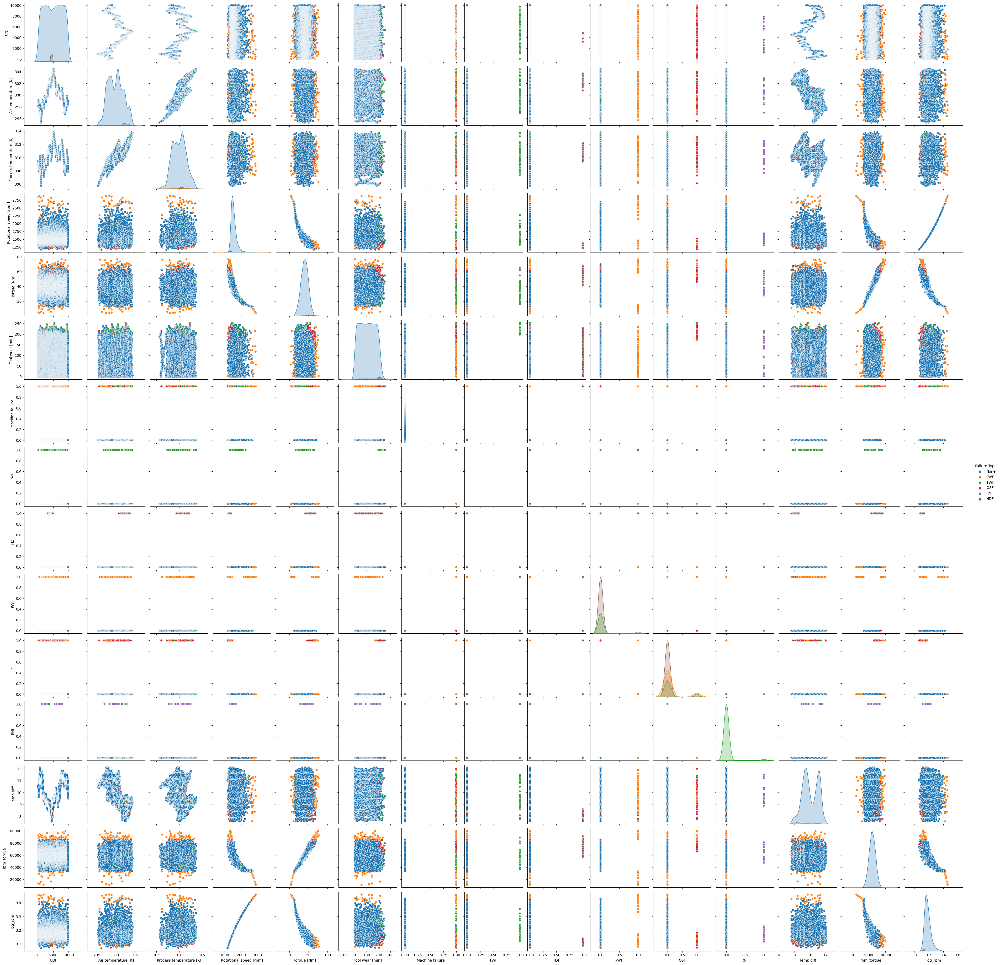

In [34]:
sns.pairplot(df, hue="Failure Type", diag_kind='kde')
plt.show()